In [1]:
import os
import sys
import glob
import obspy
import numpy as np

import matplotlib.cm as cm
import matplotlib.pyplot as plt
import pyasdf
import scipy
import math
import h5py

from scripts.Esyn_func import *

In [2]:
# detremine the h5 file for processing
path="/data/whd01/qibin_data/"
sfiles = sorted(glob.glob(os.path.join(path, 'autocorr_15_60Hz_stretched.hdf5')))
fname=sfiles[0].split("qibin_data/")[1].split(".hdf5")[0]

# path="/home/kffeng/DATA_wsd/FarmDAS/"
# sfiles = sorted(glob.glob(os.path.join(path, 'autocorr_25_50Hz_new.hdf5')))
# fname=sfiles[0].split("FarmDAS/")[1].split(".hdf5")[0]

print("The h5 file: ",sfiles)
print("Processed station pair: ",fname)

The h5 file:  ['/data/whd01/qibin_data/autocorr_15_60Hz_stretched.hdf5']
Processed station pair:  autocorr_15_60Hz_stretched


In [3]:
# detremine the h5 file for processing
comp_arr=['autocorr']
num_cmp=len(comp_arr)
fnum=1
nchn=51
# information of the input data:  lagtime (lag), sampling rate (samp)
lag=5 
samp=500
leng=int(lag*samp*2+1)
npts=leng
print("Lag-time: ",lag,", sampling rate: ",samp,", total data length in points: ",leng)
freq1=25
freq2=50

Lag-time:  5 , sampling rate:  500 , total data length in points:  5001


In [4]:
# h5f=h5py.File(sfiles[0],'r')
# autocorr=h5f['autocorr']
# nlocs, nstartf, n_lag, n_pair = autocorr.shape
# print(autocorr.shape)
# print(nlocs, nstartf, n_lag)

# locs=np.arange(44,44+nlocs)
# startf=np.arange(nstartf)

In [4]:
h5f=h5py.File(sfiles[0],'r')
autocorr=h5f['autocorr']
nlocs, nstartf, n_lag = autocorr.shape
print(autocorr.shape)
print(nlocs, nstartf, n_lag)

locs=np.arange(44,44+nlocs)
startf=np.arange(nstartf)

(50, 482, 4586)
50 482 4586


In [6]:
print(h5f.keys())
meanAC=h5f['mean_acf']
meanAC.shape

<KeysViewHDF5 ['autocorr', 'mean_acf']>


(50, 4586)

(50, 482, 1001) (50, 482, 4586)


/tmp/ipykernel_399788/3147485099.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(6,3))


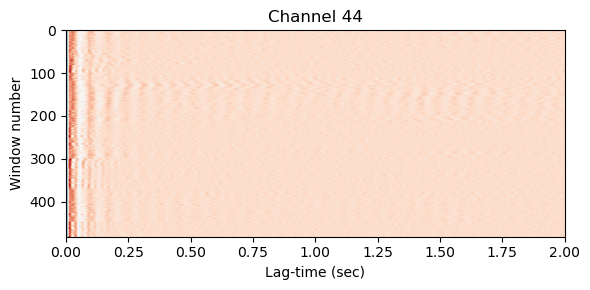

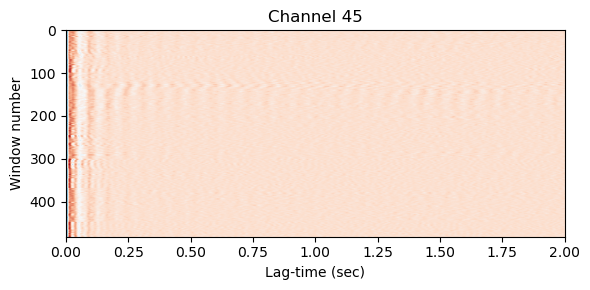

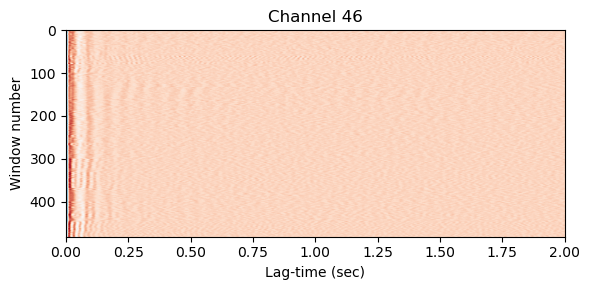

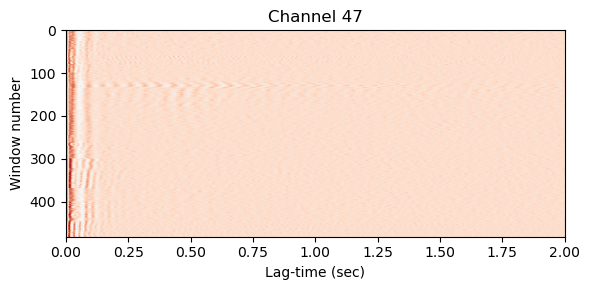

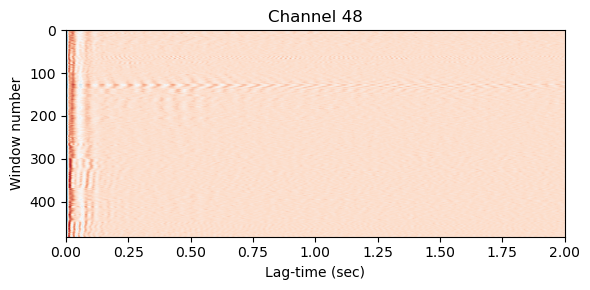

...

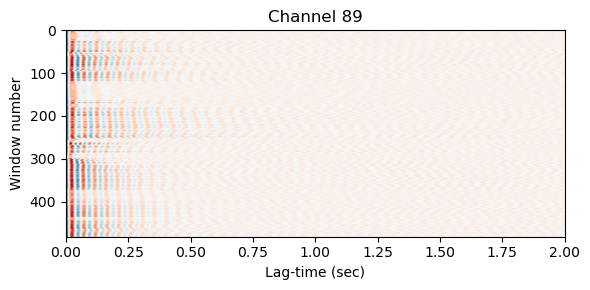

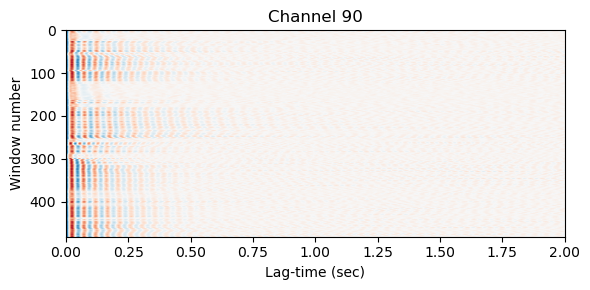

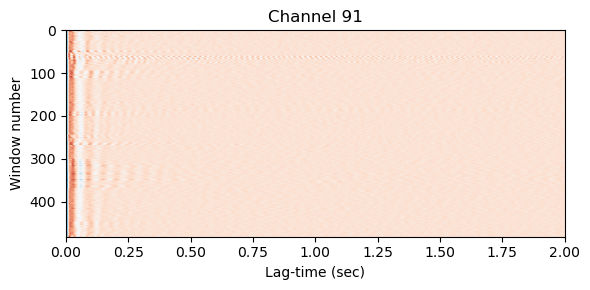

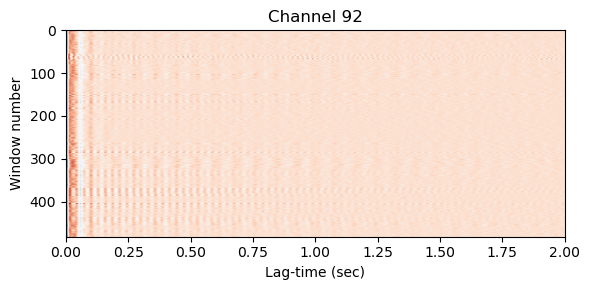

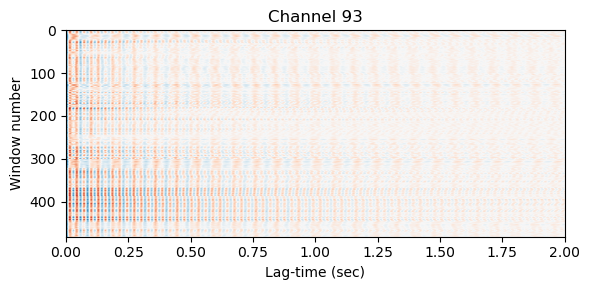

In [7]:
tlag=1000
short_ncf=np.zeros((nlocs,nstartf,tlag+1), dtype = np.float32)
print(short_ncf.shape, autocorr.shape,)

for chan in range(nlocs):
    chnm=locs[chan]
    for tsp in range(nstartf):
        short_ncf[chan,tsp, : ] =autocorr[chan, tsp, :tlag+1]
        # short_ncf[chan,tsp, : ] =autocorr[chan, tsp, ((n_lag-1)//2):((n_lag-1)//2)+tlag+1].reshape(tlag+1)
                
    # #print(np.min(short_ncf[chan]),np.max(short_ncf[chan]))
    plt.figure(figsize=(6,3))
    plt.imshow(short_ncf[chan], extent=[0,tlag/samp,nstartf,0],aspect='auto',cmap = 'RdBu')
    plt.title("Channel "+str(chnm))
    plt.ylabel('Window number')
    plt.xlabel('Lag-time (sec)')
    plt.tight_layout()
    

range(-5, 5)


/tmp/ipykernel_399788/1135583621.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(6,2))


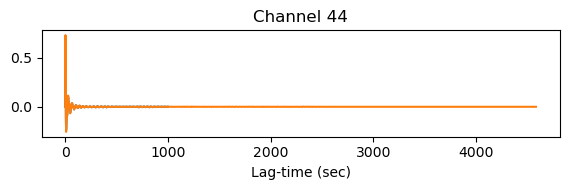

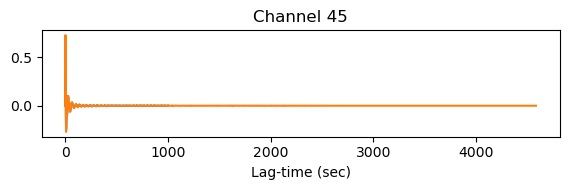

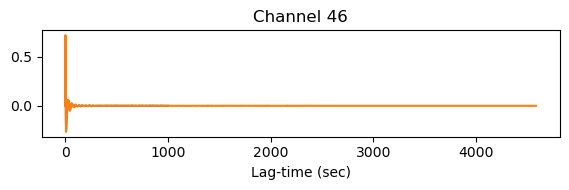

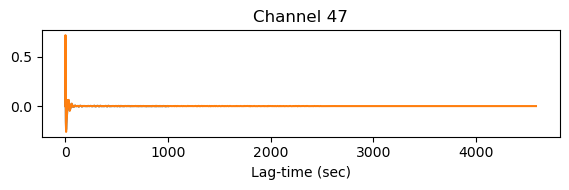

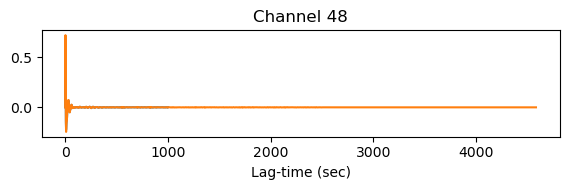

...

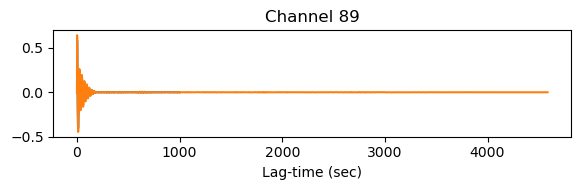

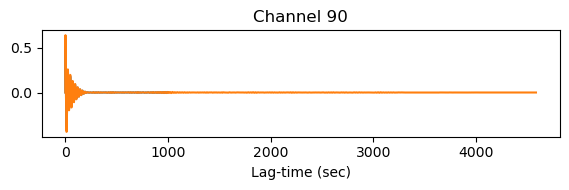

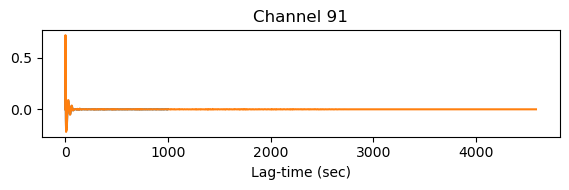

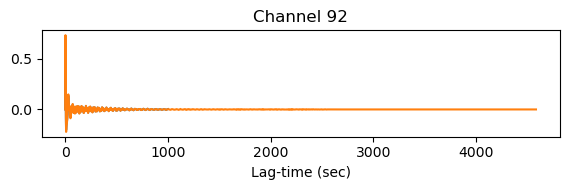

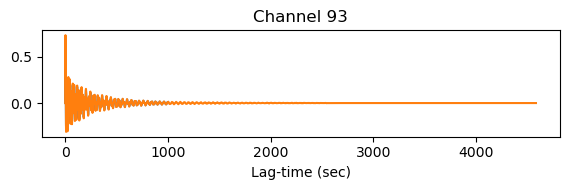

In [8]:
# Bin with windows 
bin_num=11
print(range(-int((bin_num-1)/2),int((bin_num-1)/2)))
temp_wave1=np.zeros((tlag+1), dtype = np.float32)
temp_wave2=np.zeros((nstartf, tlag+1), dtype = np.float32)
short_stackf=np.zeros((nlocs, tlag+1), dtype = np.float32)  

for chan in range(nlocs):
    chnm=locs[chan]
    for tsp in range(nstartf):
        temp_wave1[:]=0.
        if (tsp > int((bin_num-1)/2)) & (tsp < nstartf-int((bin_num-1)/2)):
            for k in range(-int((bin_num-1)/2),int((bin_num-1)/2)):
                temp_wave1 = temp_wave1 + short_ncf[chan,tsp+k, : ]
            temp_wave2[tsp] = temp_wave1/bin_num
        else:
            temp_wave2[tsp]=short_ncf[chan,tsp, : ]
            
        short_stackf[chan]=short_stackf[chan]+ temp_wave2[tsp]
        
    # fig,ax=plt.subplots(1,2,figsize=(16,3))
    # ax[0].imshow(short_ncf[chan], extent=[0,tlag/samp,nstartf,0],aspect='auto',cmap = 'RdBu')
    # ax[0].set_title("Channel "+str(chnm))
    # ax[0].set_ylabel('Window number')
    # ax[0].set_xlabel('Lag-time (sec)')
    
    # ax[1].imshow(temp_wave2, extent=[0,tlag/samp,nstartf,0],aspect='auto',cmap = 'RdBu')
    # ax[1].set_title("Channel "+str(chnm))
    # ax[1].set_ylabel('Window number')
    # ax[1].set_xlabel('Lag-time (sec)')

    short_ncf[chan]=temp_wave2
    
    plt.figure(figsize=(6,2))
    plt.plot(short_stackf[chan]/nstartf)
    plt.plot(meanAC[chan])
    plt.title("Channel "+str(chnm))
    plt.xlabel('Lag-time (sec)')
    plt.tight_layout()        


In [9]:
# f=open('Attenuation_Window_over_Chan.csv','w')
f=open('Attenuation_Window_15-60Hz_stretched.csv','w')
f.write('Channel,fmin,fmax,tbeg,tend,noiselevel\n')

# noise level setting
ratio=3
level=np.zeros((nchn))
twinbe=np.zeros((nchn,2))
twinbe[:,0]=0.012


# smooth 
winlen=0.05  # smoothing window length
dt=1/samp


msv=np.zeros((nlocs, tlag+1))
ptime=np.arange(0,(tlag+1)/samp,dt)
# get all components average smoothed and 
# determine the noise level coda window used to measure attenuation
for chan in range(nlocs):
    chnm=locs[chan]
    para = { 'winlen':winlen, 'dt':dt , 'npts':tlag+1}
    msv[chan]=get_smooth(short_stackf[chan], para)
    msv[chan]=msv[chan]/np.max(msv[chan])
        
    sym=msv[chan]
    Val_mad=mad(sym)
    level[chan]=Val_mad*ratio
    
    for pt in range( int(twinbe[chan,0]/dt), len(sym), 1):
        if (sym[pt] < float(level[chan])):
            twinbe[chan,1]=float(pt/samp) - (1/freq1)
            print(chan,pt,", window: ",twinbe[chan])
            break

    line=f'{locs[chan]},{freq1:.2f},{freq2:.2f},{twinbe[chan,0]:.6f},{twinbe[chan,1]:.6f},{level[chan]:.8f}\n'

    f.write(line)      
# plot_fmsv_waveforms(freq,fmsv_mean[aa],fname[aa],level[aa],twinbe[aa])
f.close()        
        

0 217 , window:  [0.012 0.394]
1 274 , window:  [0.012 0.508]
2 282 , window:  [0.012 0.524]
3 112 , window:  [0.012 0.184]
4 171 , window:  [0.012 0.302]
5 115 , window:  [0.012 0.19 ]
6 124 , window:  [0.012 0.208]
7 251 , window:  [0.012 0.462]
8 280 , window:  [0.012 0.52 ]
9 165 , window:  [0.012 0.29 ]
10 144 , window:  [0.012 0.248]
11 160 , window:  [0.012 0.28 ]
12 240 , window:  [0.012 0.44 ]
13 232 , window:  [0.012 0.424]
14 203 , window:  [0.012 0.366]
15 170 , window:  [0.012 0.3  ]
16 278 , window:  [0.012 0.516]
17 279 , window:  [0.012 0.518]
18 247 , window:  [0.012 0.454]
19 216 , window:  [0.012 0.392]
20 217 , window:  [0.012 0.394]
21 215 , window:  [0.012 0.39 ]
22 189 , window:  [0.012 0.338]
23 307 , window:  [0.012 0.574]
24 283 , window:  [0.012 0.526]
25 282 , window:  [0.012 0.524]
26 300 , window:  [0.012 0.56 ]
27 231 , window:  [0.012 0.422]
28 343 , window:  [0.012 0.646]
29 381 , window:  [0.012 0.722]
30 382 , window:  [0.012 0.724]
31 382 , window:  

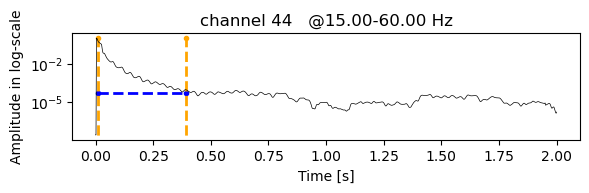

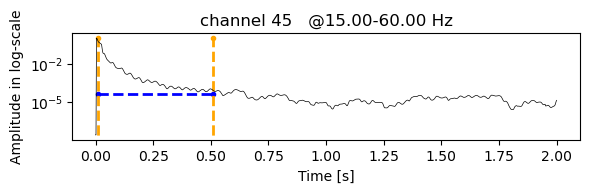

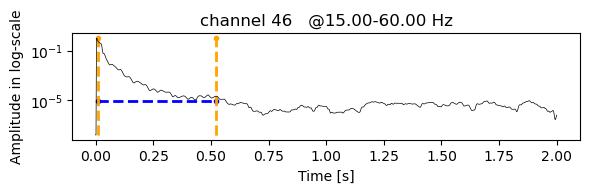

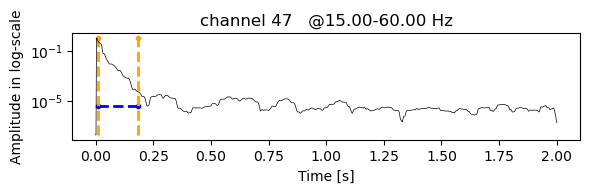

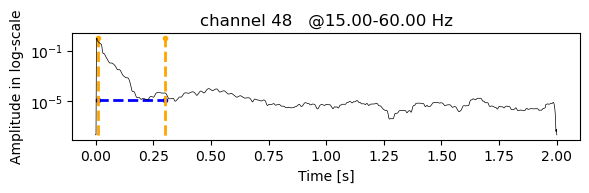

...

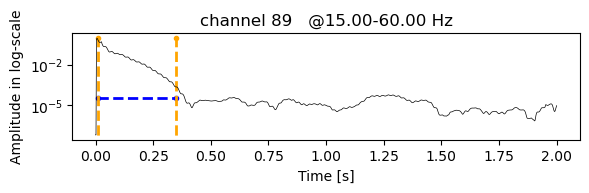

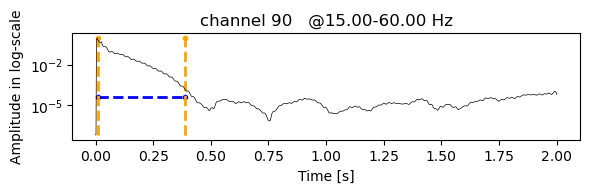

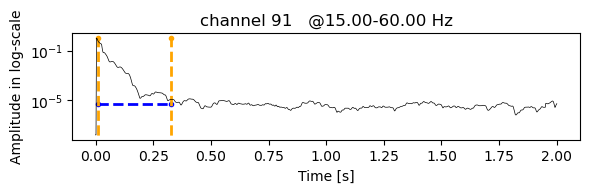

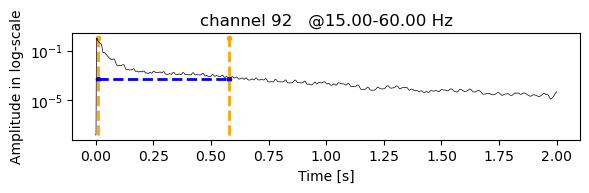

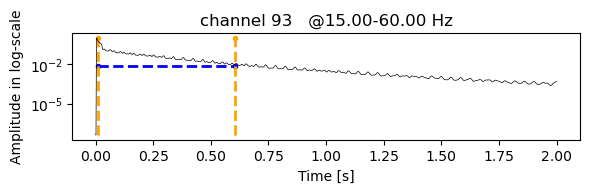

In [10]:
for chan in range(nlocs):
    chnm=locs[chan]
    plt.figure(figsize=(6,2))
    fmin=15
    fmax=60
    absy=1 #max(wav[fb], key=abs)
    # plt.ylim(10e-5,1)
    plt.plot([twinbe[chan, 0],twinbe[chan,-1]],[level[chan],level[chan]],c='blue',marker='.',ls='--', linewidth=2)
    plt.plot([twinbe[chan, 0],twinbe[chan,0]],[-0.1,absy],c='orange',marker='.',ls='--', linewidth=2)
    plt.plot([twinbe[chan, 1],twinbe[chan,1]],[-0.1,absy],c='orange',marker='.',ls='--', linewidth=2)
    plt.yscale('log', base=10)
    plt.plot(ptime,msv[chan], "k-", linewidth=0.5)
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude in log-scale")
    plt.title( "channel %s   @%4.2f-%4.2f Hz" % ( chnm,fmin,fmax ) )
    plt.tight_layout()
    plt.show()
    # plt.title("Channel "+str(chnm))
    # plt.ylabel('Window number')
    # plt.xlabel('Lag-time (sec)')
    # plt.tight_layout()    